In [1]:
import numpy as np
import os
import sys
import pandas as pd
import warnings
import matplotlib.pyplot as plt
from ground.base import get_context
from scipy.ndimage import gaussian_filter
from scipy.interpolate import splev

from stepselect import Unconditional_XY, Conditional_dXdY, LogNormalDist, ParametricModel, MarkovModel, main, sigma_opt, time_constant_opt, get_spline
from stepselect_analysis import markov_sigma, time_constants, timeopt_auto
from generator import Metro_SemiPar, OneStepSemiPar, generate

#below only needed for waldo data
from viz_dataset import load_data

#constants

extent = (0,1920,0,1080)
mmperpx = 0.2825
screendist = 1000 #mm

n_candidates = 9 #num false steps per real step

In [2]:
### 1: Prepare waldo data


traindata = load_data('waldo_2024','train')
testdata1 = load_data('waldo_2024','test')
testdata2 = load_data('waldo_2024','val')
testdata = testdata1 + testdata2
testIDs = testdata1.IDs + testdata2.IDs
trainIDs = traindata.IDs


stds = traindata.S_std.numpy().flatten()
means = traindata.S_mean.numpy().flatten()
traindata = [data.detach().numpy() for data in traindata]
testdata = [data.detach().numpy() for data in testdata]

#un-normalize
for x in traindata:
   x[:,1:] = x[:,1:]*stds + means
for x in testdata:
   x[:,1:] = x[:,1:]*stds + means



In [ ]:
### 2: Optimize KDE (Waldo)
   
sig1arr = np.arange(1000,3001,500)
sig2arr = np.arange(10,51,10)
models = sigma_opt(traindata,extent,sig1arr=sig1arr,sig2arr=sig2arr)

In [5]:
save_file = 'stepselect_data/stepselect_waldo2024_sigma_opt.csv'
basedist = Unconditional_XY(traindata,extent)
sigma_df = main(testdata,basedist,models,n_candidates,save_file=save_file,data_ids=('waldo_2024',testIDs)) 

Running 25 new or modified models.

Sequence 1 of 70
99%
Sequence 2 of 70
99%
Sequence 3 of 70
99%
Sequence 4 of 70
99%
Sequence 5 of 70
99%
Sequence 6 of 70
99%
Sequence 7 of 70
99%
Sequence 8 of 70
99%
Sequence 9 of 70
99%
Sequence 10 of 70
99%
Sequence 11 of 70
99%
Sequence 12 of 70
99%
Sequence 13 of 70
99%
Sequence 14 of 70
99%
Sequence 15 of 70
99%
Sequence 16 of 70
98%
Sequence 17 of 70
99%
Sequence 18 of 70
99%
Sequence 19 of 70
99%
Sequence 20 of 70
99%
Sequence 21 of 70
99%
Sequence 22 of 70
99%
Sequence 23 of 70
99%
Sequence 24 of 70
99%
Sequence 25 of 70
99%
Sequence 26 of 70
99%
Sequence 27 of 70
99%
Sequence 28 of 70
99%
Sequence 29 of 70
99%
Sequence 30 of 70
99%
Sequence 31 of 70
99%
Sequence 32 of 70
99%
Sequence 33 of 70
99%
Sequence 34 of 70
99%
Sequence 35 of 70
99%
Sequence 36 of 70
99%
Sequence 37 of 70
99%
Sequence 38 of 70
99%
Sequence 39 of 70
99%
Sequence 40 of 70
99%
Sequence 41 of 70
99%
Sequence 42 of 70
99%
Sequence 43 of 70
99%
Sequence 44 of 70
99%
Seque

Optimization terminated successfully.
         Current function value: 0.141942
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:                92710
Model:                          Logit   Df Residuals:                    92708
Method:                           MLE   Df Model:                            1
Date:                Thu, 03 Jul 2025   Pseudo R-squ.:                  0.5634
Time:                        23:43:13   Log-Likelihood:                -13159.
converged:                       True   LL-Null:                       -30138.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -0.1731      0.018     -9.774      0.000      

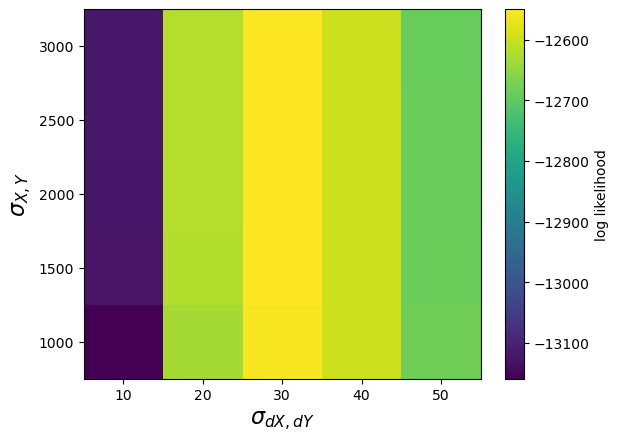

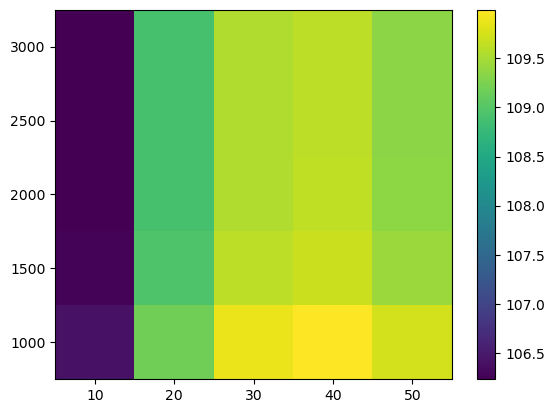

[-13159.400874526536, -12632.623059232363, -12555.22326986231, -12595.011685449474, -12682.21077040174, -13126.416765002732, -12618.818259438412, -12549.504406896584, -12594.981148559948, -12687.483632476165, -13121.689324064655, -12617.434127143133, -12549.610329095218, -12596.204602374437, -12689.790331284883, -13121.257946008802, -12617.333187044766, -12549.656705366635, -12596.362455510773, -12690.056983140747, -13121.239484382348, -12617.329536300196, -12549.660101623354, -12596.37126334865, -12690.071047931398]


In [6]:

#sigma_df = pd.read_csv('stepselect_data/stepselect_waldo2024_sigma_opt.csv')
fig_sigma = markov_sigma(sigma_df,sig1arr=sig1arr,sig2arr=sig2arr)
fig_sigma.savefig('figs/suppinfo/sigma.eps',bbox_inches='tight')


In [8]:
### 3: Optimize time constants (Waldo)

#use foveal angle for max_r
kwargs = {}
kwargs["max_r"] = screendist*np.tan(1.5*np.pi/180)/mmperpx
save_file = 'stepselect_data/stepselect_waldo2024_timeopt.csv'
models = time_constant_opt(None,extent,**kwargs)
basedist = LogNormalDist(traindata,extent)
timeconst_df = main(traindata,basedist,models,n_candidates,save_file=save_file,data_ids=('waldo_2024',trainIDs))        



Running 136 new or modified models.

Sequence 1 of 209
99%
Sequence 2 of 209
99%
Sequence 3 of 209
99%
Sequence 4 of 209
99%
Sequence 5 of 209
99%
Sequence 6 of 209
99%
Sequence 7 of 209
99%
Sequence 8 of 209
99%
Sequence 9 of 209
99%
Sequence 10 of 209
99%
Sequence 11 of 209
99%
Sequence 12 of 209
99%
Sequence 13 of 209
99%
Sequence 14 of 209
99%
Sequence 15 of 209
99%
Sequence 16 of 209
99%
Sequence 17 of 209
99%
Sequence 18 of 209
99%
Sequence 19 of 209
99%
Sequence 20 of 209
99%
Sequence 21 of 209
99%
Sequence 22 of 209
99%
Sequence 23 of 209
99%
Sequence 24 of 209
99%
Sequence 25 of 209
99%
Sequence 26 of 209
99%
Sequence 27 of 209
99%
Sequence 28 of 209
99%
Sequence 29 of 209
99%
Sequence 30 of 209
99%
Sequence 31 of 209
99%
Sequence 32 of 209
99%
Sequence 33 of 209
99%
Sequence 34 of 209
99%
Sequence 35 of 209
99%
Sequence 36 of 209
99%
Sequence 37 of 209
99%
Sequence 38 of 209
99%
Sequence 39 of 209
99%
Sequence 40 of 209
99%
Sequence 41 of 209
99%
Sequence 42 of 209
99%
Sequen

Optimization terminated successfully.
         Current function value: 0.305503
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:               280230
Model:                          Logit   Df Residuals:                   280150
Method:                           MLE   Df Model:                           79
Date:                Fri, 04 Jul 2025   Pseudo R-squ.:                 0.06023
Time:                        09:39:55   Log-Likelihood:                -85611.
converged:                       True   LL-Null:                       -91098.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                               0.3750      0.719 

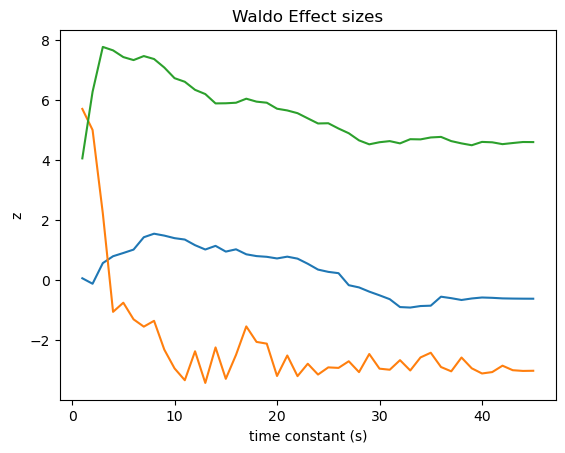

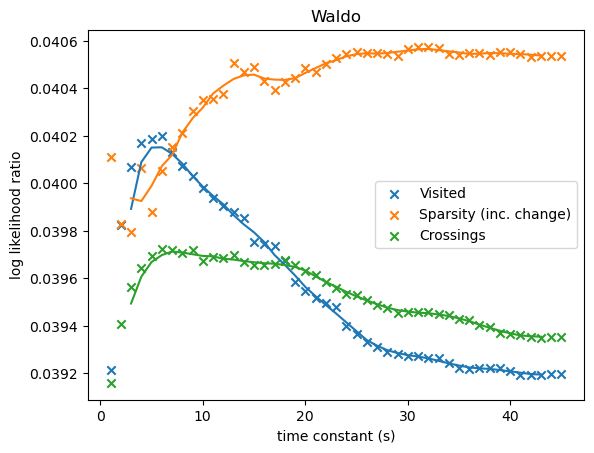

Optimization terminated successfully.
         Current function value: 0.304099
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:               280230
Model:                          Logit   Df Residuals:                   280108
Method:                           MLE   Df Model:                          121
Date:                Fri, 04 Jul 2025   Pseudo R-squ.:                 0.06455
Time:                        09:59:03   Log-Likelihood:                -85218.
converged:                       True   LL-Null:                       -91098.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
Intercept                 

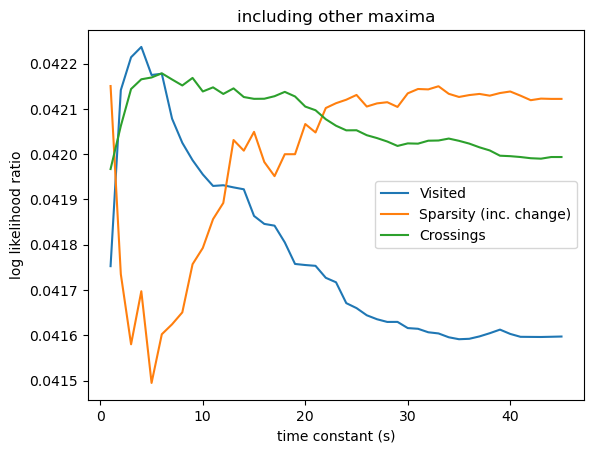

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


crossings_7 whistdist_32*whistdist_change_32 have_visited_6
Optimization terminated successfully.
         Current function value: 0.304380
         Iterations 8
[23.005 23.005 23.005] -0.04140534014360896
Optimization terminated successfully.
         Current function value: 0.304408
         Iterations 8
[38.00166667 23.005      23.005     ] -0.04135077770027058
Optimization terminated successfully.
         Current function value: 0.304284
         Iterations 8
[ 8.00833333 23.005      23.005     ] -0.04159732616472813
Optimization terminated successfully.
         Current function value: 0.304357
         Iterations 9
[23.005      38.00166667 23.005     ] -0.04145168936886538
Optimization terminated successfully.
         Current function value: 0.304508
         Iterations 8
[23.005       8.00833333 23.005     ] -0.04115030571079999
Optimization terminated successfully.
         Current function value: 0.304436
         Iterations 8
[23.005      23.005      38.00166667] -0.0412940

In [10]:
timeconst_df = pd.read_csv('stepselect_data/stepselect_waldo2024_timeopt.csv')
fig_timeconst,fig_timeconst2 = time_constants(timeconst_df,'Waldo')
fig_timeconst.savefig('figs/suppinfo/timeconst_waldo.eps')
fig_timeconst2.savefig('figs/suppinfo/timeconst_waldo_allmax.eps')
timeopt_auto(timeconst_df)

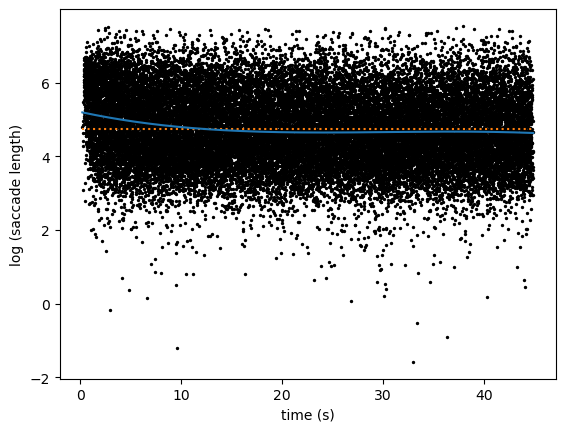

In [3]:
spl,fig_spline = get_spline(traindata,plot=True)
fig_spline.savefig('figs/suppinfo/ampspline_fit.eps')
fig_spline.savefig('figs/suppinfo/ampspline_fit.png')

In [13]:
### 4: Final step selection (Waldo)

kwargs = {}

kwargs["maxtime_cross"]=7.0
kwargs["maxtime_closest"]=32.0
kwargs["maxtime_visited"]=6.0
kwargs["max_r"] = screendist*np.tan(1.5*np.pi/180)/mmperpx

basedist_waldo = LogNormalDist(traindata,extent,seed=123)
#Sigmas from step 2:
markovdist_waldo = Conditional_dXdY(traindata,extent,seed=444,sigma_dxdy=30,sigma_xy=1500,ampspline=spl)

In [14]:
models=[]
models.append(ParametricModel(extent,**kwargs))
models.append(MarkovModel(markovdist_waldo,predname="markov_dxdy",ampspline=spl))

save_file = 'stepselect_data/stepselect_waldo2024_train.csv'
waldo_stepselect_train = main(traindata,basedist_waldo,models,n_candidates,save_file=save_file,data_ids=('waldo_2024',trainIDs))        
save_file = 'stepselect_data/stepselect_waldo2024_test.csv'
waldo_stepselect_test = main(testdata,basedist_waldo,models,n_candidates,save_file=save_file,data_ids=('waldo_2024',testIDs))
save_file = 'stepselect_data/stepselect_waldo2024_alldata.csv'

waldo_stepselect_alldata = pd.concat([waldo_stepselect_train,waldo_stepselect_test])
waldo_stepselect_alldata.to_csv(save_file,index=False)

Running 2 new or modified models.

Sequence 1 of 209
99%
Sequence 2 of 209
99%
Sequence 3 of 209
99%
Sequence 4 of 209
99%
Sequence 5 of 209
99%
Sequence 6 of 209
99%
Sequence 7 of 209
99%
Sequence 8 of 209
99%
Sequence 9 of 209
99%
Sequence 10 of 209
99%
Sequence 11 of 209
99%
Sequence 12 of 209
99%
Sequence 13 of 209
99%
Sequence 14 of 209
99%
Sequence 15 of 209
99%
Sequence 16 of 209
99%
Sequence 17 of 209
99%
Sequence 18 of 209
99%
Sequence 19 of 209
99%
Sequence 20 of 209
99%
Sequence 21 of 209
99%
Sequence 22 of 209
99%
Sequence 23 of 209
99%
Sequence 24 of 209
99%
Sequence 25 of 209
99%
Sequence 26 of 209
99%
Sequence 27 of 209
99%
Sequence 28 of 209
99%
Sequence 29 of 209
99%
Sequence 30 of 209
99%
Sequence 31 of 209
99%
Sequence 32 of 209
99%
Sequence 33 of 209
99%
Sequence 34 of 209
99%
Sequence 35 of 209
99%
Sequence 36 of 209
99%
Sequence 37 of 209
99%
Sequence 38 of 209
99%
Sequence 39 of 209
99%
Sequence 40 of 209
99%
Sequence 41 of 209
99%
Sequence 42 of 209
99%
Sequence

In [15]:
### 5: Generative models (Waldo)

bound = True
maxtime = 45.0
n_iter=70

## Markovian model

markovdist_waldo.rng = np.random.default_rng(444)
markov_model = MarkovModel(markovdist_waldo,predname="markov_dxdy",ampspline=spl)
mcmc = Metro_SemiPar(markov_model,None,None,traindata,[extent[0],extent[1]],[extent[2],extent[3]])

for i in range(n_iter):
       
    mcmc.set_seed(111+i)
           
    times,locs,_ = generate(mcmc,600,maxtime=maxtime,sample_direct=True)
        
    data=np.array([times,locs[:,0],locs[:,1]]).T
    df = pd.DataFrame(data,columns=['t','x','y'])

    filename='generator_markov_dxdy_dirsample_' + str(i) + '.csv'           
    if not os.path.exists('generator_data'):
        os.mkdir('generator_data')
    filepath = os.path.join('generator_data',filename)
    df.to_csv(filepath,index=False)
    


0 1047.4137201674466 647.2460741625988
1 824.1165756838485 772.5198077409675
2 1342.5062327171663 270.6346350412963
3 1346.0821637705258 365.16052997699643
4 1189.9643569657796 346.0860907941473
5 269.2203272150442 473.3199265958973
6 302.5390101047522 405.90211254316444
7 194.9169921434292 429.41463980610274
8 133.19882615471624 416.4021047834707
9 207.41162257488833 349.04396799730034
10 48.985861018409565 547.5552576157006
11 542.971697643085 534.873714472093
12 134.4015941092212 989.0436367467123
13 65.14563340430321 991.8176467165531
14 101.60507352602036 949.6303424118727
15 973.5625943166358 790.5161624176227
16 839.2853398775994 839.3920982320067
17 695.5845475313095 831.3332763552628
18 837.8374049726968 574.6612427724854
19 669.3549135057242 373.2969604095216
20 622.579175721463 322.664972858835
21 641.0080890307544 350.0362910498298
22 852.8484238047847 393.0562238100471
23 1098.9618041307285 459.8107912590077
24 1128.1795228804003 383.4490431813247
25 1318.4303257607885 460

In [16]:
## Semiparametric model w/ history

ss_df = pd.read_csv("stepselect_data/stepselect_waldo2024_train.csv")
ss_df['logdist_sq'] = ss_df['logdist']**2
cols = ['dist','logdist','logdist_sq','dir_change','dir_change2','cardinality','horiz_align','log_amp_change','dist_1back','centre_dist_init','centre_dist_change','have_visited','whistdist','whistdist_change','crossings']

res = stepwise_regression(ss_df,cols,extra=['logdist*t'])#,thresh=0.001)
basedist_waldo.rng = np.random.default_rng(555)
par_markov_model = MarkovModel(basedist_waldo)
param_model = ParametricModel(extent,cols=cols,**kwargs)
mcmc = OneStepSemiPar(par_markov_model,param_model,res,traindata,[extent[0],extent[1]],[extent[2],extent[3]])

for i in range(n_iter):
       
    mcmc.set_seed(222+i)
           
    times,locs,_ = generate(mcmc,600,maxtime=maxtime)
        
    data=np.array([times,locs[:,0],locs[:,1]]).T
    df = pd.DataFrame(data,columns=['t','x','y'])

    filename='generator_semipar_hist_' + str(i) + '.csv'           
    if not os.path.exists('generator_data'):
        os.mkdir('generator_data')
    filepath = os.path.join('generator_data',filename)
    df.to_csv(filepath,index=False)
    


Starting with 120 terms
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.65651869265
Removing dist_1back:whistdist
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.65651911595
Removing dir_change:centre_dist_init
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.66204191091
Removing dir_change2:centre_dist_change
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.67361699615
Removing log_amp_change:have_visited
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.68697933288
Removing centre_dist_init:whistdist
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.70471314527
Removing have_visited:whistdist
Optimization terminated successfully.


In [17]:
## Semiparametric model w/out history

ss_df = pd.read_csv("stepselect_data/stepselect_waldo2024_train.csv")
ss_df['logdist_sq'] = ss_df['logdist']**2
cols = ['dist','logdist','logdist_sq','dir_change','dir_change2','cardinality','horiz_align','log_amp_change','dist_1back','centre_dist_init','centre_dist_change']

res = stepwise_regression(ss_df,cols,extra=['logdist*t'])#,thresh=0.001)
basedist_waldo.rng = np.random.default_rng(666)
par_markov_model = MarkovModel(basedist_waldo)
param_model = ParametricModel(extent,cols=cols,**kwargs)
mcmc = OneStepSemiPar(par_markov_model,param_model,res,traindata,[extent[0],extent[1]],[extent[2],extent[3]])

for i in range(n_iter):
       
    mcmc.set_seed(333+i)
           
    times,locs,_ = generate(mcmc,600,maxtime=maxtime)
        
    data=np.array([times,locs[:,0],locs[:,1]]).T
    df = pd.DataFrame(data,columns=['t','x','y'])

    filename='generator_semipar_nohist_' + str(i) + '.csv'           
    if not os.path.exists('generator_data'):
        os.mkdir('generator_data')
    filepath = os.path.join('generator_data',filename)
    df.to_csv(filepath,index=False)
    


Starting with 66 terms
Optimization terminated successfully.
         Current function value: 0.305433
         Iterations 7
-85591.62813587162
Removing dist:dir_change
Optimization terminated successfully.
         Current function value: 0.305434
         Iterations 7
-85591.6590667143
Removing logdist_sq:log_amp_change
Optimization terminated successfully.
         Current function value: 0.305434
         Iterations 7
-85591.76866965422
Removing dist:log_amp_change
Optimization terminated successfully.
         Current function value: 0.305434
         Iterations 7
-85591.78770483639
Removing dist:dir_change2
Optimization terminated successfully.
         Current function value: 0.305435
         Iterations 7
-85591.9614746423
Removing logdist_sq:horiz_align
Optimization terminated successfully.
         Current function value: 0.305435
         Iterations 7
-85592.16919455794
Removing dir_change2:centre_dist_change
Optimization terminated successfully.
         Current function va

In [18]:
### 5: Prepare data (Randpix)


traindata_rp = load_data('randpix','train')
testdata1 = load_data('randpix','test')
testdata2 = load_data('randpix','val')
testdata_rp = testdata1 + testdata2
testIDs_rp = testdata1.IDs + testdata2.IDs
trainIDs_rp = traindata_rp.IDs

stds = traindata_rp.S_std.numpy().flatten()
means = traindata_rp.S_mean.numpy().flatten()

t_max = 45.0

traindata_rp = [data.detach().numpy()[data[:,0]<t_max,:] for data in traindata_rp]
testdata_rp = [data.detach().numpy()[data[:,0]<t_max,:] for data in testdata_rp]

#un-normalize
for x in traindata_rp:
   x[:,1:] = x[:,1:]*stds + means
for x in testdata_rp:
   x[:,1:] = x[:,1:]*stds + means

In [16]:
### 7: Optimize time constants (Randpix)

kwargs = {}
kwargs["max_r"] = screendist*np.tan(1.5*np.pi/180)/mmperpx
save_file = 'stepselect_data/stepselect_randpix_timeopt.csv'
models = time_constant_opt(None,extent,**kwargs)
basedist_rp = LogNormalDist(traindata_rp,extent)
timeconst_df = main(traindata_rp,basedist_rp,models,n_candidates,save_file=save_file,data_ids=('waldo_2024',trainIDs_rp))        


Running 136 new or modified models.

Sequence 1 of 69
99%
Sequence 2 of 69
99%
Sequence 3 of 69
99%
Sequence 4 of 69
99%
Sequence 5 of 69
99%
Sequence 6 of 69
99%
Sequence 7 of 69
99%
Sequence 8 of 69
99%
Sequence 9 of 69
99%
Sequence 10 of 69
99%
Sequence 11 of 69
98%
Sequence 12 of 69
99%
Sequence 13 of 69
99%
Sequence 14 of 69
99%
Sequence 15 of 69
99%
Sequence 16 of 69
99%
Sequence 17 of 69
99%
Sequence 18 of 69
99%
Sequence 19 of 69
99%
Sequence 20 of 69
99%
Sequence 21 of 69
99%
Sequence 22 of 69
98%
Sequence 23 of 69
99%
Sequence 24 of 69
99%
Sequence 25 of 69
99%
Sequence 26 of 69
99%
Sequence 27 of 69
99%
Sequence 28 of 69
99%
Sequence 29 of 69
99%
Sequence 30 of 69
99%
Sequence 31 of 69
99%
Sequence 32 of 69
99%
Sequence 33 of 69
99%
Sequence 34 of 69
99%
Sequence 35 of 69
98%
Sequence 36 of 69
99%
Sequence 37 of 69
99%
Sequence 38 of 69
99%
Sequence 39 of 69
98%
Sequence 40 of 69
98%
Sequence 41 of 69
99%
Sequence 42 of 69
99%
Sequence 43 of 69
99%
Sequence 44 of 69
99%
Sequ

Optimization terminated successfully.
         Current function value: 0.294128
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:                59990
Model:                          Logit   Df Residuals:                    59910
Method:                           MLE   Df Model:                           79
Date:                Fri, 11 Jul 2025   Pseudo R-squ.:                 0.09522
Time:                        23:51:28   Log-Likelihood:                -17645.
converged:                       True   LL-Null:                       -19502.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                               1.2219      1.959 

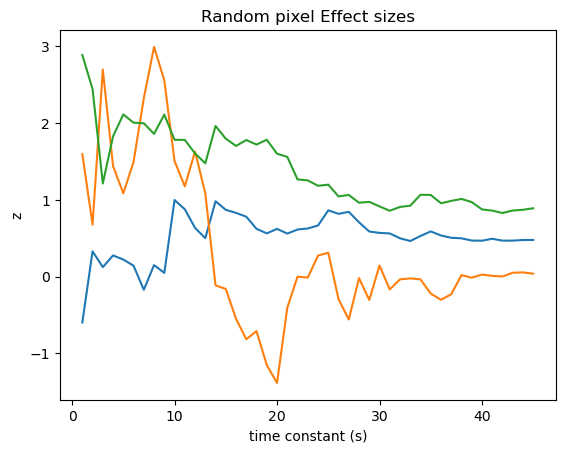

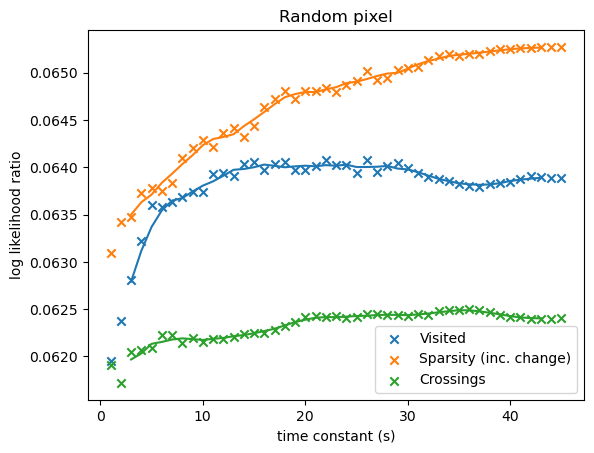

Optimization terminated successfully.
         Current function value: 0.291421
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:                59990
Model:                          Logit   Df Residuals:                    59868
Method:                           MLE   Df Model:                          121
Date:                Sat, 12 Jul 2025   Pseudo R-squ.:                  0.1035
Time:                        00:01:53   Log-Likelihood:                -17482.
converged:                       True   LL-Null:                       -19502.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
Intercept                 

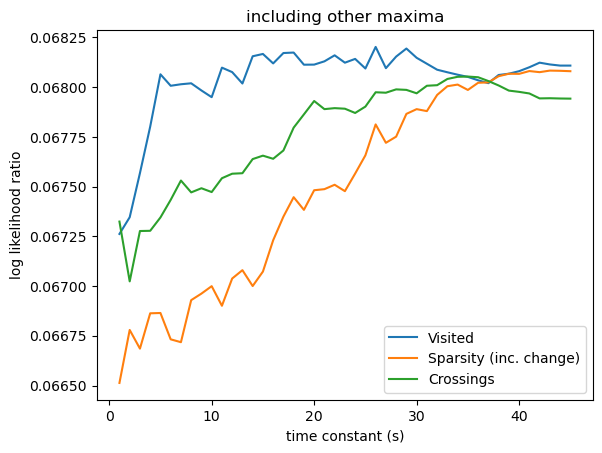

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


crossings_35 whistdist_43*whistdist_change_43 have_visited_16


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Optimization terminated successfully.
         Current function value: 0.291405
         Iterations 8
[23.005 23.005 23.005] -0.06735549487001581
Optimization terminated successfully.
         Current function value: 0.291379
         Iterations 8
[38.00166667 23.005      23.005     ] -0.06740805121005687
Optimization terminated successfully.
         Current function value: 0.291580
         Iterations 8
[ 8.00833333 23.005      23.005     ] -0.06700565675774182
Optimization terminated successfully.
         Current function value: 0.291138
         Iterations 8
[23.005      38.00166667 23.005     ] -0.06788989265163226
Optimization terminated successfully.
         Current function value: 0.291636
         Iterations 8
[23.005       8.00833333 23.005     ] -0.06689350671553264
Optimization terminated successfully.
         Current function value: 0.291414
         Iterations 8
[23.005      23.005      38.00166667] -0.0673373089983535
Optimization terminated successfully.
         Cur

In [17]:
timeconst_df = pd.read_csv('stepselect_data/stepselect_randpix_timeopt.csv')
max_t = 45
fig_timeconst3,fig_timeconst4 = time_constants(timeconst_df[timeconst_df.t<max_t],'Random pixel')
fig_timeconst3.savefig('figs/suppinfo/timeconst_randpix.eps')
fig_timeconst4.savefig('figs/suppinfo/timeconst_randpix_allmax.eps')
timeopt_auto(timeconst_df)

In [19]:
### 8: Final step selection (Randpix)

kwargs = {}
kwargs["maxtime_cross"]=35.0
kwargs["maxtime_closest"]=43.0
kwargs["maxtime_visited"]=16.0
kwargs["max_r"] = screendist*np.tan(1.5*np.pi/180)/mmperpx

basedist_rp = LogNormalDist(traindata_rp,extent,seed=456)
#Sigmas from step 2:
markovdist_rp = Conditional_dXdY(traindata_rp,extent,seed=444,sigma_dxdy=30,sigma_xy=1500)
spl = get_spline(traindata_rp) 

models=[]
models.append(ParametricModel(extent,**kwargs))
models.append(MarkovModel(markovdist_rp,predname="markov_dxdy",ampspline=spl))

save_file = 'stepselect_data/stepselect_randpix_train.csv'
randpix_stepselect_train = main(traindata_rp,basedist_rp,models,n_candidates,save_file=save_file,data_ids=('waldo_2024',trainIDs_rp))        
save_file = 'stepselect_data/stepselect_randpix_test.csv'
randpix_stepselect_test = main(testdata_rp,basedist_rp,models,n_candidates,save_file=save_file,data_ids=('waldo_2024',testIDs_rp))
save_file = 'stepselect_data/stepselect_randpix_alldata.csv'
randpix_stepselect_alldata = pd.concat([randpix_stepselect_train,randpix_stepselect_test])
randpix_stepselect_alldata.to_csv(save_file,index=False)

Running 2 new or modified models.

Sequence 1 of 69
99%
Sequence 2 of 69
99%
Sequence 3 of 69
99%
Sequence 4 of 69
99%
Sequence 5 of 69
99%
Sequence 6 of 69
99%
Sequence 7 of 69
99%
Sequence 8 of 69
99%
Sequence 9 of 69
99%
Sequence 10 of 69
99%
Sequence 11 of 69
98%
Sequence 12 of 69
99%
Sequence 13 of 69
99%
Sequence 14 of 69
99%
Sequence 15 of 69
99%
Sequence 16 of 69
99%
Sequence 17 of 69
99%
Sequence 18 of 69
99%
Sequence 19 of 69
99%
Sequence 20 of 69
99%
Sequence 21 of 69
99%
Sequence 22 of 69
98%
Sequence 23 of 69
99%
Sequence 24 of 69
99%
Sequence 25 of 69
99%
Sequence 26 of 69
99%
Sequence 27 of 69
99%
Sequence 28 of 69
99%
Sequence 29 of 69
99%
Sequence 30 of 69
99%
Sequence 31 of 69
99%
Sequence 32 of 69
99%
Sequence 33 of 69
99%
Sequence 34 of 69
99%
Sequence 35 of 69
98%
Sequence 36 of 69
99%
Sequence 37 of 69
99%
Sequence 38 of 69
99%
Sequence 39 of 69
98%
Sequence 40 of 69
98%
Sequence 41 of 69
99%
Sequence 42 of 69
99%
Sequence 43 of 69
99%
Sequence 44 of 69
99%
Sequen

using model arguments: {'maxtime_cross': 7.0, 'maxtime_closest': 32.0, 'maxtime_visited': 6.0, 'max_r': 92.6935276785378}
Starting with 120 terms
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.65651869263
Removing dist_1back:whistdist
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.65651911592
Removing dir_change:centre_dist_init
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.66204191095
Removing centre_dist_change:dir_change2
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.67361699612
Removing log_amp_change:have_visited
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.68697933288
Removing centre_dist_init:whistdist
Optimization terminated successfully.
         Current function value

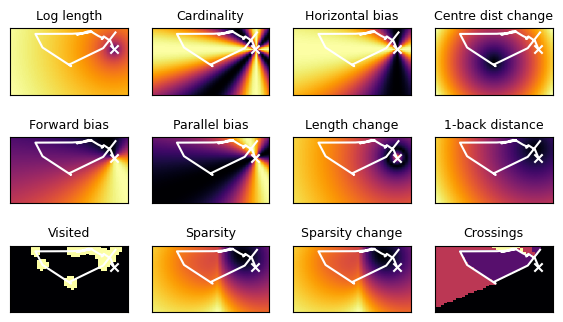

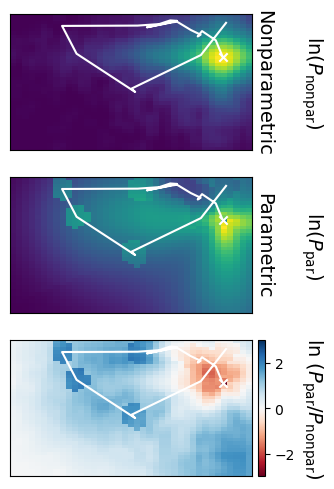

In [3]:
### 9: Figure 1

from stepselect_analysis import heatmaps, stepwise_regression

kwargs = {}
kwargs["maxtime_cross"]=7.0
kwargs["maxtime_closest"]=32.0
kwargs["maxtime_visited"]=6.0
kwargs["max_r"] = screendist*np.tan(1.5*np.pi/180)/mmperpx

fig_heat_predictors,fig_heat_compare,_,_,_ = heatmaps('waldo_2024','stepselect_data/stepselect_waldo2024_train.csv',2,19,extent,**kwargs)    
fig_heat_predictors.savefig("figs/heatmaps.eps",bbox_inches="tight")
fig_heat_compare.savefig("figs/heatmaps2.eps",bbox_inches="tight")

In [4]:
#randpix final model
filename = 'stepselect_data/stepselect_randpix_train.csv'
cols = ['dist','logdist','logdist_sq','cardinality','horiz_align','centre_dist_change','dir_change','dir_change2','log_amp_change','dist_1back','centre_dist_init','have_visited','whistdist','whistdist_change','crossings']
ss_df = pd.read_csv(filename)
ss_df['logdist_sq'] = ss_df['logdist']**2
res = stepwise_regression(ss_df,cols,extra=['logdist*t'])


Starting with 120 terms
Optimization terminated successfully.
         Current function value: 0.290799
         Iterations 8
-17445.01422246708
Removing cardinality:whistdist_change
Optimization terminated successfully.
         Current function value: 0.290799
         Iterations 8
-17445.014325851876
Removing horiz_align:log_amp_change
Optimization terminated successfully.
         Current function value: 0.290799
         Iterations 8
-17445.015315925066
Removing log_amp_change:centre_dist_init
Optimization terminated successfully.
         Current function value: 0.290799
         Iterations 8
-17445.0172277057
Removing dist_1back:have_visited
Optimization terminated successfully.
         Current function value: 0.290799
         Iterations 8
-17445.019253141676
Removing logdist_sq:have_visited
Optimization terminated successfully.
         Current function value: 0.290799
         Iterations 8
-17445.02283742627
Removing dir_change:whistdist
Optimization terminated successfully.

Starting with 120 terms
Optimization terminated successfully.
         Current function value: 0.303821
         Iterations 8
-85139.6565186926
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:               280230
Model:                          Logit   Df Residuals:                   280108
Method:                           MLE   Df Model:                          121
Date:                Fri, 10 Oct 2025   Pseudo R-squ.:                 0.06541
Time:                        15:21:18   Log-Likelihood:                -85140.
converged:                       True   LL-Null:                       -91098.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept       

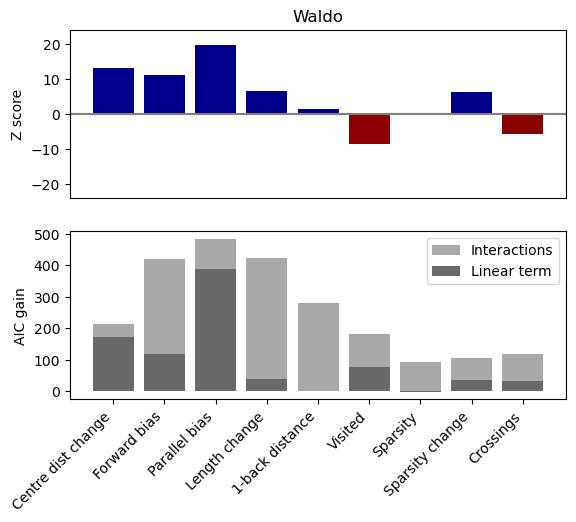

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Starting with 120 terms
Optimization terminated successfully.
         Current function value: 0.290799
         Iterations 8
-17445.01422246708
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:                59990
Model:                          Logit   Df Residuals:                    59868
Method:                           MLE   Df Model:                          121
Date:                Fri, 10 Oct 2025   Pseudo R-squ.:                  0.1055
Time:                        15:25:58   Log-Likelihood:                -17445.
converged:                       True   LL-Null:                       -19502.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept      

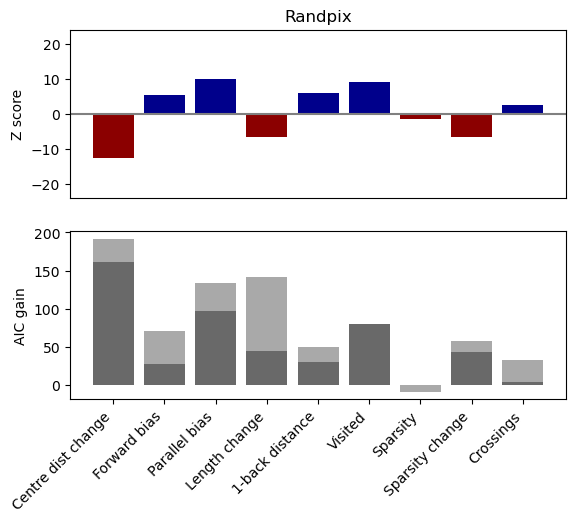

Starting with 11 terms
Optimization terminated successfully.
         Current function value: 0.321259
         Iterations 7
-90026.30589985056
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:               280230
Model:                          Logit   Df Residuals:                   280216
Method:                           MLE   Df Model:                           13
Date:                Fri, 10 Oct 2025   Pseudo R-squ.:                 0.01176
Time:                        15:27:12   Log-Likelihood:                -90026.
converged:                       True   LL-Null:                       -91098.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept       

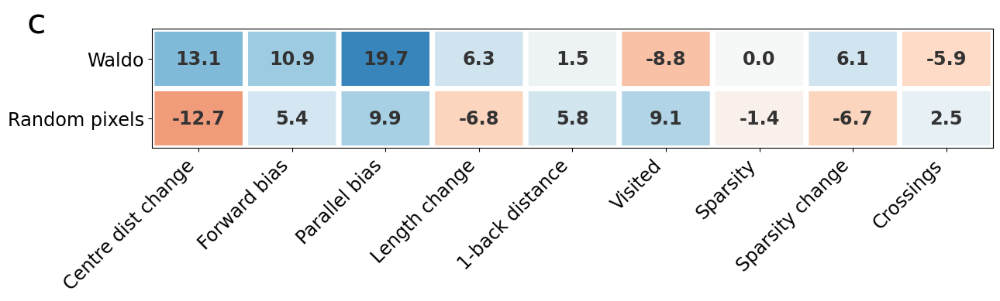

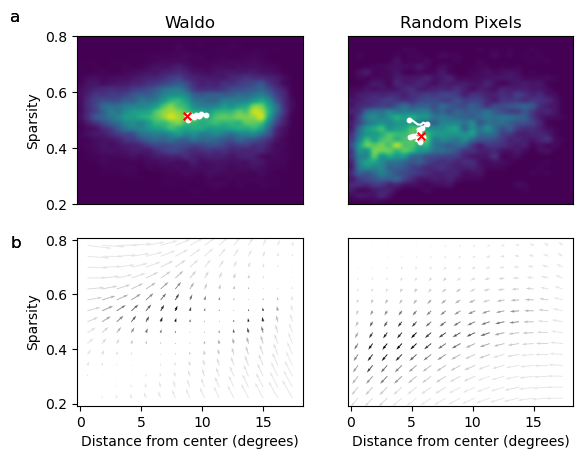

In [21]:
### 10: Figure 2

from stepselect_analysis import var_importance, compare_var_importance, spatial_dist

llr_lin1,llr_int1,base_effects1,fig_aic_waldo = var_importance("stepselect_data/stepselect_waldo2024_train.csv",'Waldo',legend=True)
fig_aic_waldo.savefig("figs/suppinfo/z_aic_waldo.eps",bbox_inches="tight")

llr_lin2,llr_int2,base_effects2,fig_aic_randpix = var_importance("stepselect_data/stepselect_randpix_train.csv",'Randpix')
fig_aic_randpix.savefig("figs/suppinfo/z_aic_randpix.eps",bbox_inches="tight")

fig_var_importance = compare_var_importance(base_effects1,base_effects2)
fig_var_importance.savefig("figs/effect_sizes.eps",bbox_inches="tight")

fig_spatial = spatial_dist(["stepselect_data/stepselect_waldo2024_train.csv","stepselect_data/stepselect_randpix_train.csv"],["Waldo","Random Pixels"],mmperpx=mmperpx,screendist=screendist)
fig_spatial.savefig("figs/spatial.eps",bbox_inches="tight")



model parameters: {'maxtime_cross': 7.0}
Using degree units
Ruj0-S2
Ruj1-S1
Ruj1-S9
Ruj11-S8
Ruj12-S7
Ruj14-S6
Ruj16-S5
Ruj17-S4
Ruj19-S3
Ruj20-S2
Ruj21-S1
Ruj21-S9
Ruj24-S8
Ruj28-S7
Ruj31-S6
Ruj32-S5
Ruj33-S4
Ruj34-S3
Ruj35-S2
Ruj36-S1
Ruj36-S9
Ruj37-S8
Ruj38-S7
Ruj39-S6
Ruj4-S5
Ruj40-S4
Ruj5-S3
Ruj51-S2
Ruj53-S1
Ruj53-S9
Ruj54-S8
Ruj58-S7
Ruj6-S6
Ruj8-S5
Ruj9-S4
Ruj0-S1
Ruj0-S9
Ruj1-S8
Ruj11-S7
Ruj12-S6
Ruj14-S5
Ruj16-S4
Ruj17-S3
Ruj19-S2
Ruj20-S1
Ruj20-S9
Ruj21-S8
Ruj24-S7
Ruj28-S6
Ruj31-S5
Ruj32-S4
Ruj33-S3
Ruj34-S2
Ruj35-S1
Ruj35-S9
Ruj36-S8
Ruj37-S7
Ruj38-S6
Ruj39-S5
Ruj4-S4
Ruj40-S3
Ruj5-S2
Ruj51-S1
Ruj51-S9
Ruj53-S8
Ruj54-S7
Ruj58-S6
Ruj6-S5
Ruj8-S4
Ruj9-S3
generator_markov_dxdy_dirsample_0.csv
generator_markov_dxdy_dirsample_1.csv
generator_markov_dxdy_dirsample_10.csv
generator_markov_dxdy_dirsample_11.csv
generator_markov_dxdy_dirsample_12.csv
generator_markov_dxdy_dirsample_13.csv
generator_markov_dxdy_dirsample_14.csv
generator_markov_dxdy_dirsample_15.csv
generator_markov

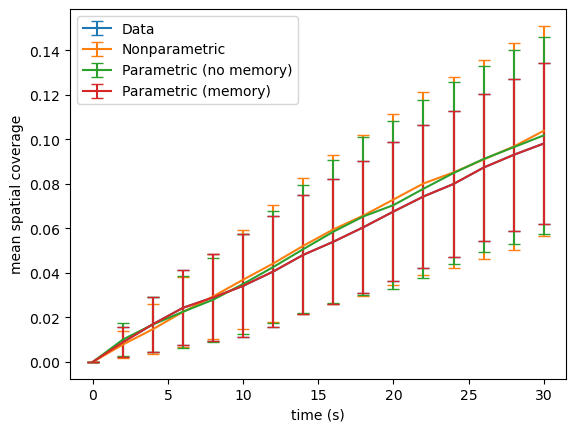

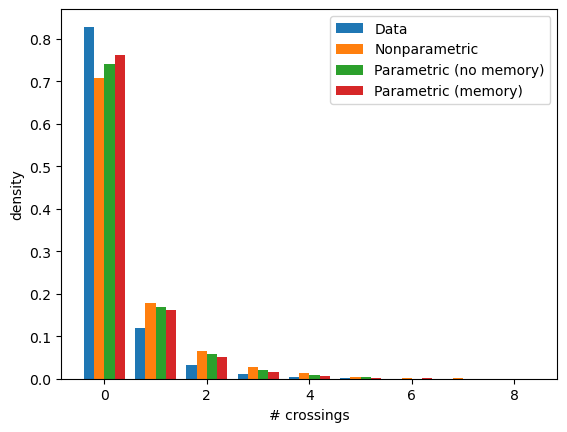

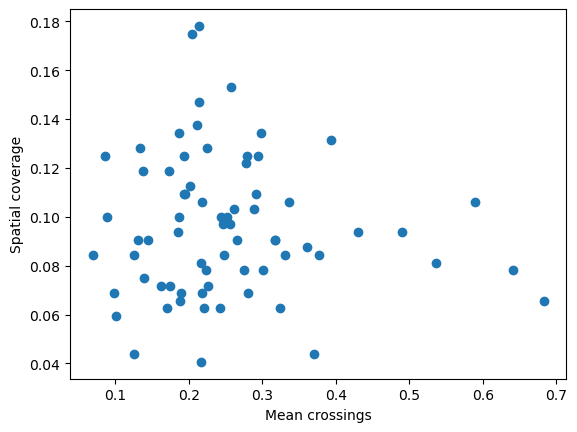

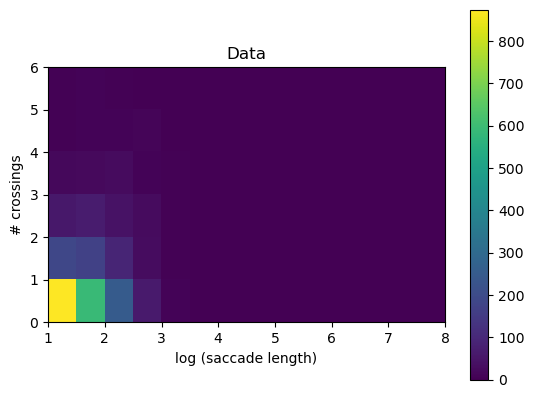

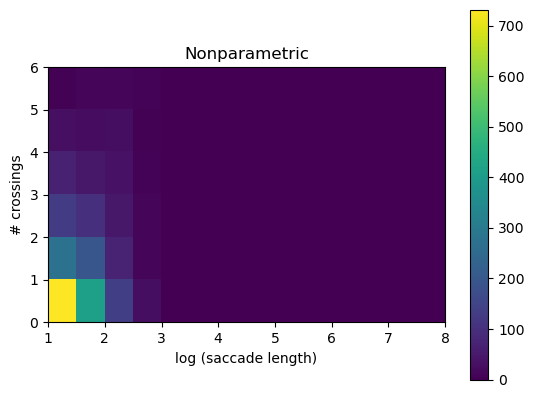

...

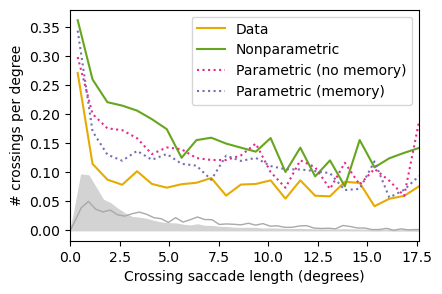

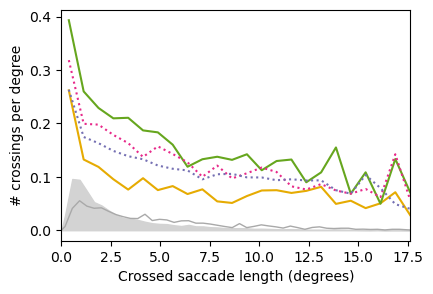

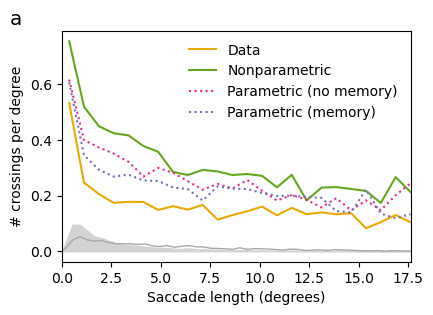

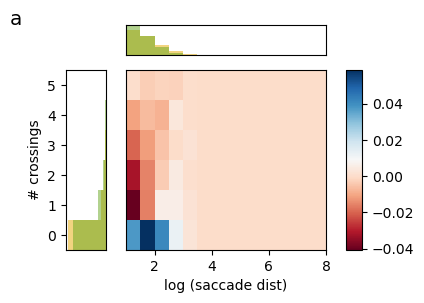

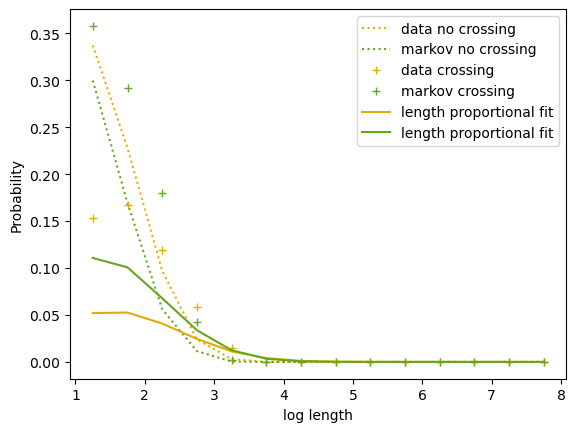

C:\Users\aszor\Virtual Eye\neural_stpp-main\generator_analysis.py:1167: RuntimeWarning: invalid value encountered in divide
  plt.plot(x,np.sum(allh[0][1:,:]*cross,axis=0)/np.sum(allh[0],axis=0)/np.exp(x))
C:\Users\aszor\Virtual Eye\neural_stpp-main\generator_analysis.py:1168: RuntimeWarning: invalid value encountered in divide
  plt.plot(x,np.sum(allh[1][1:,:]*cross,axis=0)/np.sum(allh[1],axis=0)/np.exp(x))


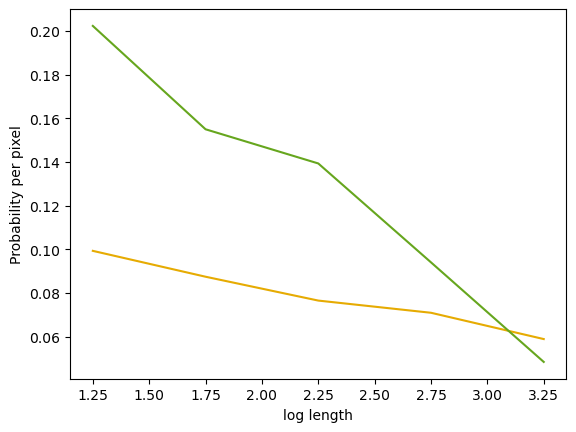

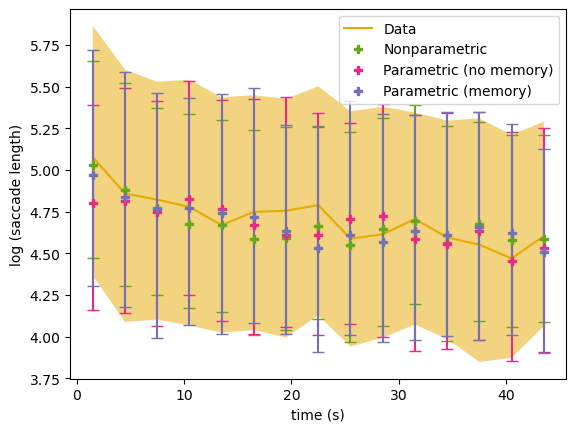

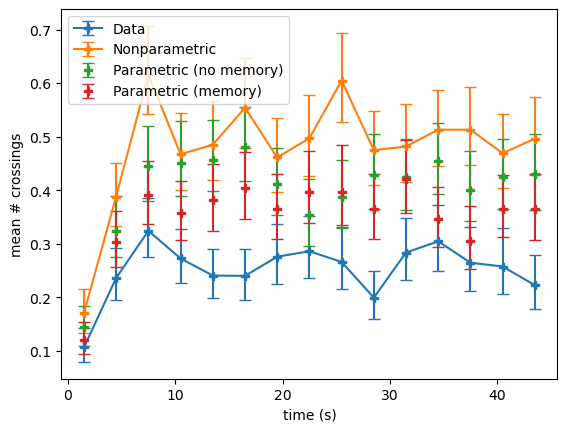

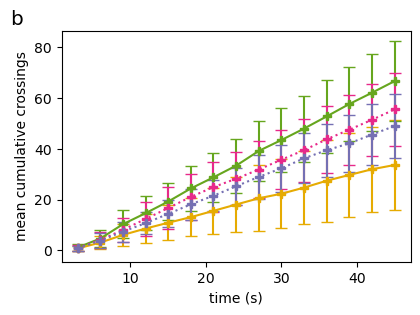

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [3]:
### 11: Figure 3

from generator_analysis import crossing_comparison

kwargs = {}
kwargs['extent'] = extent
kwargs['mmperpx'] = mmperpx
kwargs['screendist'] = screendist
kwargs['maxtime_cross'] = 7.0

fig_perpix,fig_crossing_perpix,fig_crossed_perpix,fig_ampspline,fig_cumcross,_,_ = crossing_comparison('generator_data',['markov_dxdy_dirsample','semipar_nohist','semipar_hist'],'waldo_2024',normalized=True,leg=['Data','Nonparametric','Parametric (no memory)','Parametric (memory)'],**kwargs)

fig_perpix.savefig("figs/crossings_perpix.eps",bbox_inches="tight")
fig_crossing_perpix.savefig("figs/suppinfo/perpix_crossing.eps",bbox_inches="tight")
fig_crossed_perpix.savefig("figs/suppinfo/perpix_crossed.eps",bbox_inches="tight")
fig_cumcross.savefig("figs/cumcross.eps",bbox_inches="tight")
fig_ampspline.savefig("figs/suppinfo/ampspline.eps",bbox_inches="tight")



In [1]:
### 12: Random effect extraction

from stepselect_analysis import multiproc_mixedreg

preds =  ['logdist', 'logdist_sq', 'cardinality', 'horiz_align', 'centre_dist_change', 'dir_change', 'dir_change2', 'log_amp_change','have_visited', 'whistdist', 'whistdist_change','crossings']
labels = ['Log length','Cardinality','Horizontal bias', 'Centre dist change','Forward bias','Parallel bias','Length change','Visited','Sparsity','Sparsity change','Crossings']


In [24]:
### Waldo

filename = 'stepselect_data/stepselect_waldo2024_alldata.csv'
llr,icc,y,sig_preds = multiproc_mixedreg(filename,preds,labels,trialtest=True)
print(icc)
print(sig_preds)
df = pd.concat(y,axis=1)
df.to_csv('stepselect_data/random_effects_waldo.csv')

Optimization terminated successfully.
         Current function value: 0.310589
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:               372940
Model:                          Logit   Df Residuals:                   372927
Method:                           MLE   Df Model:                           12
Date:                Mon, 13 Oct 2025   Pseudo R-squ.:                 0.04458
Time:                        00:56:06   Log-Likelihood:            -1.1583e+05
converged:                       True   LL-Null:                   -1.2124e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -1.0191      0.115     -8.864      0.000      -1.244      -0.794
logdi

In [5]:
import json

iccdict = dict(list(zip(sig_preds,icc)))
with open('stepselect_data/waldo_icc.json', 'w') as f:
    json.dump(iccdict, f)

In [25]:
### Randpix

filename = 'stepselect_data/stepselect_randpix_alldata.csv'
_,_,y,_ = multiproc_mixedreg(filename,preds,labels,trialtest=False)
df = pd.concat(y,axis=1)
df.to_csv('stepselect_data/random_effects_randpix.csv')

Optimization terminated successfully.
         Current function value: 0.298084
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:                80700
Model:                          Logit   Df Residuals:                    80687
Method:                           MLE   Df Model:                           12
Date:                Mon, 13 Oct 2025   Pseudo R-squ.:                 0.08305
Time:                        11:14:34   Log-Likelihood:                -24055.
converged:                       True   LL-Null:                       -26234.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  3.3341      0.310     10.751      0.000       2.726       3.942
logdi

In [6]:
from stepselect_analysis import mixed_effects_figs
import pandas as pd
import json

Fixation time correlations [(0.5456634989996373, 0.0014984959197123697), (0.03125023512159712, 0.8674610826388702), (0.0825469957057878, 0.6588727778342296), (-0.09748202693167207, 0.6018805453786957), (-0.20230923369931814, 0.2750722135625159), (-0.12651201807147103, 0.4976603441678495), (-0.13258115631930573, 0.4770880321796081), (0.3365787663621612, 0.06410979544236448)]
Basic logdist correlation: PearsonRResult(statistic=0.5328526989582258, pvalue=0.002027428922842015)


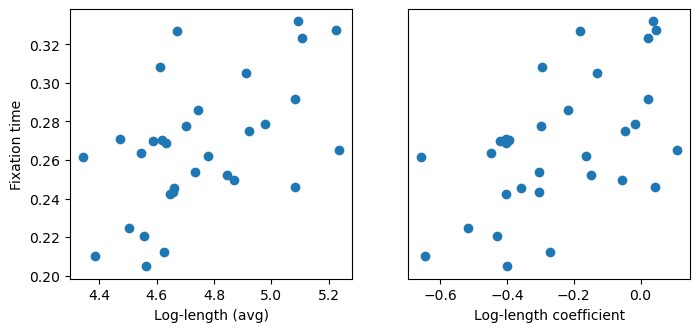

PC1 variance 0.6483116259850735
Fixation time PC1 corr -0.5376616158176439 p = 0.0018124464198230816
Inverting PC1
PC2 variance 0.18026988805547212
Fixation time PC2 corr 0.08726174600556849 p = 0.640657834900095


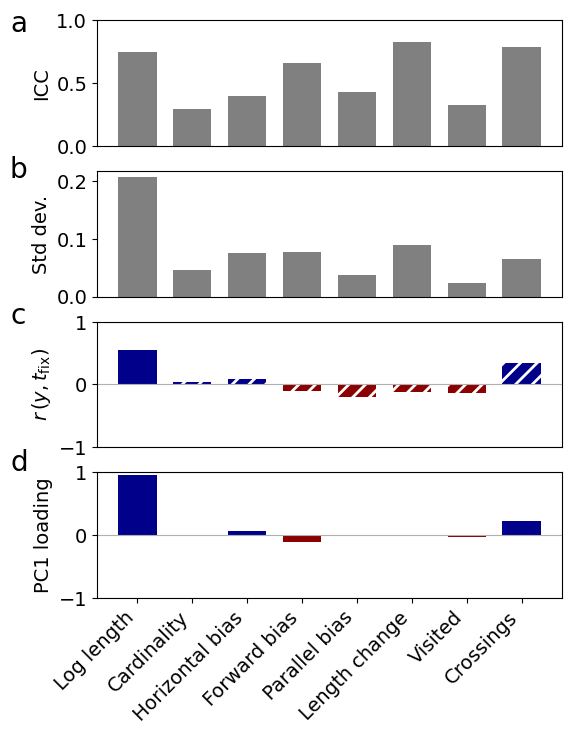

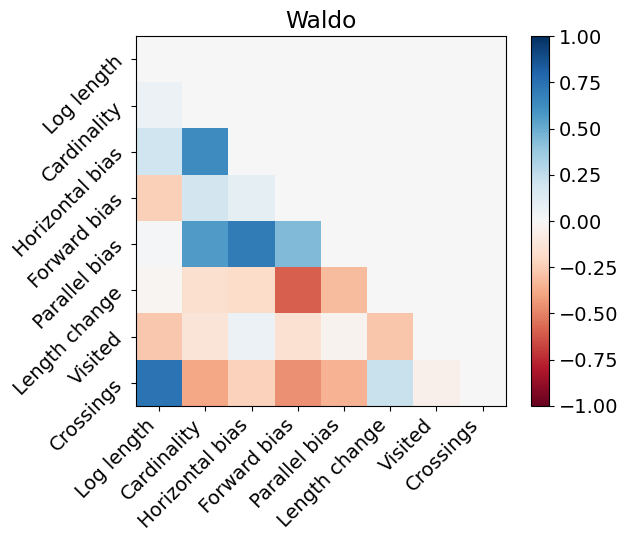

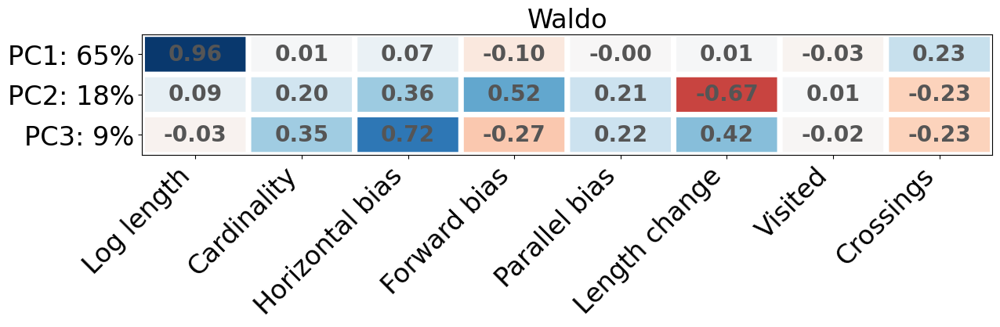

In [7]:
randeff_file = 'stepselect_data/random_effects_waldo.csv'
basic_file = '../basicmeasures_waldo2024_rescaled.csv'

with open('stepselect_data/waldo_icc.json','r') as f:
        iccdata = json.load(f)
icc=list(iccdata.values())
sig_preds=list(iccdata.keys())
waldo_df = pd.read_csv(randeff_file,index_col=0)
mixedeff_fig_waldo,corrmap_fig_waldo,pc_fig_waldo,scatter_fig_waldo,fixtime_waldo = mixed_effects_figs(randeff_file,basic_file,icc,'Waldo',labels=sig_preds)
mixedeff_fig_waldo.savefig('figs/ind_diff_waldo.eps',bbox_inches='tight')
pc_fig_waldo.savefig('figs/suppinfo/pc_waldo.eps',bbox_inches='tight')
corrmap_fig_waldo.savefig('figs/suppinfo/corrmat_waldo.eps',bbox_inches='tight')
scatter_fig_waldo.savefig('figs/suppinfo/fixtime_scatter.eps',bbox_inches='tight')

Fixation time correlations [(-0.21510037084242392, 0.24520394104157278), (-0.21676882602320277, 0.24147354809621585), (-0.0946770166555145, 0.6124232798476587), (-0.36962209859251843, 0.04070584594890947), (-0.33058606078401753, 0.06930264870688477), (-0.1243152860940075, 0.5052151325240254), (-0.19785406664104485, 0.2860047880500072), (0.2344933632602512, 0.2041760660784823), (-0.26815422019459834, 0.1446940798165595), (-0.2682182207000151, 0.1445945488868536), (0.2063980879507782, 0.2652795979562375)]
Basic logdist correlation: PearsonRResult(statistic=-0.07353875970555115, pvalue=0.694205988120539)


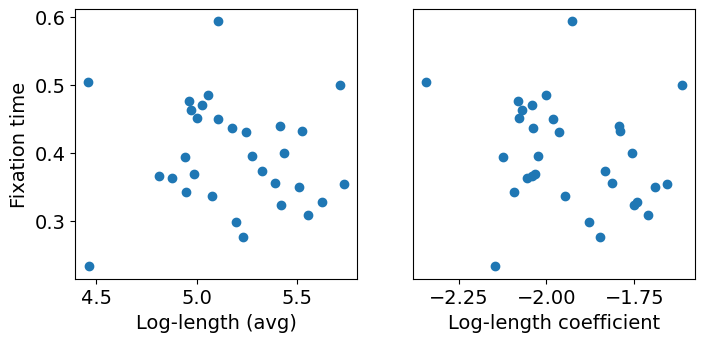

PC1 variance 0.6295435488154223
Fixation time PC1 corr 0.3344638444274647 p = 0.06590649710083524
PC2 variance 0.18796553168037078
Fixation time PC2 corr 0.07911445114740029 p = 0.6722564462097348


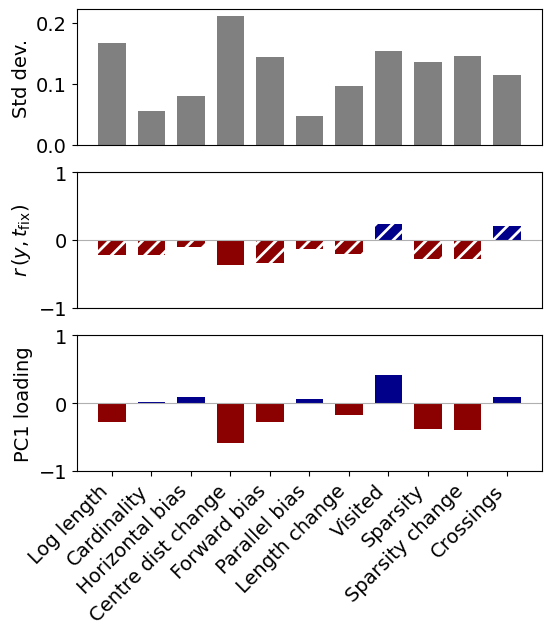

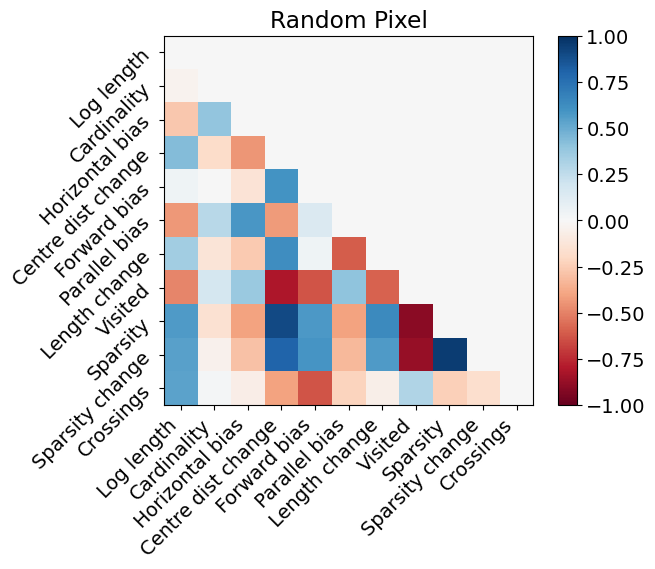

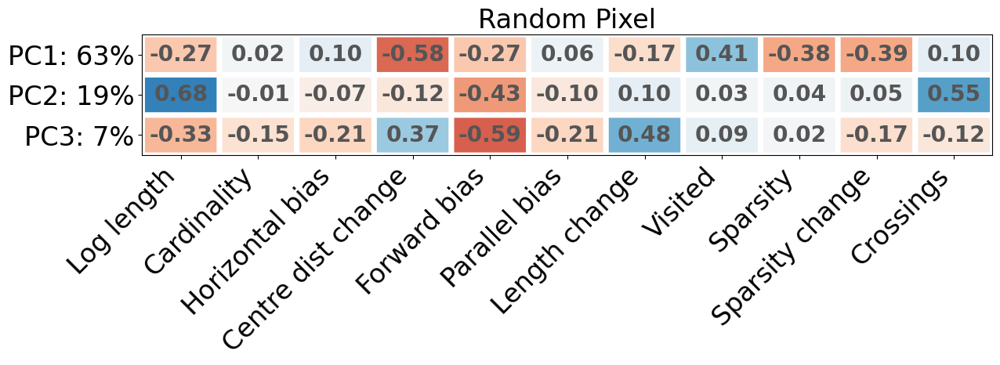

In [4]:
randeff_file2 = 'stepselect_data/random_effects_randpix.csv'
basic_file2 = '../basicmeasures_randpix_rescaled.csv'
randpix_df = pd.read_csv(randeff_file2,index_col=0)
mixedeff_fig_randpix,corrmap_fig_randpix,pc_fig_randpix,_,fixtime_randpix = mixed_effects_figs(randeff_file2,basic_file2,[],'Random Pixel',labels=labels)
mixedeff_fig_randpix.savefig('figs/suppinfo/ind_diff_randpix.eps',bbox_inches='tight')
corrmap_fig_randpix.savefig('figs/suppinfo/corrmat_randpix.eps',bbox_inches='tight')
pc_fig_randpix.savefig('figs/suppinfo/pc_randpix.eps',bbox_inches='tight')

In [6]:
from scipy import stats
import numpy as np

task_corr = {}
for col in waldo_df.columns:
    corr = stats.pearsonr(randpix_df[col],waldo_df[col])
    if corr.pvalue<0.05:
        task_corr[col] = [corr.statistic,corr.pvalue]
    else:
        task_corr[col] = [np.nan,np.nan]
print(task_corr)

{'logdist': [0.43320306647034157, 0.014917248262081918], 'cardinality': [nan, nan], 'horiz_align': [0.4227184121463638, 0.01782911230449505], 'dir_change': [0.6106984751686677, 0.00026357395765309367], 'dir_change2': [0.5457785736393503, 0.0014943511430166824], 'log_amp_change': [0.39816012307443505, 0.026527750723993743], 'have_visited': [nan, nan], 'crossings': [0.38352688280448555, 0.033184553892959656]}
